# Hotel Booking

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [2]:
import warnings
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
df=pd.read_csv('hotel_bookings.csv')
df.head(2)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015


In [4]:
#dataframe shape
df.shape

(119390, 32)

In [5]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [6]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [7]:
#these are columns which have missing value as seen from above
[col for col in df.columns if df[col].isna().any()]

['children', 'country', 'agent', 'company']

In [8]:
df.children.unique()

array([ 0.,  1.,  2., 10.,  3., nan])

In [9]:
df.fillna(0,inplace=True)

In [10]:
#unique value in each column
df.apply(lambda x:len(x.unique()))

hotel                                2
is_canceled                          2
lead_time                          479
arrival_date_year                    3
arrival_date_month                  12
arrival_date_week_number            53
arrival_date_day_of_month           31
stays_in_weekend_nights             17
stays_in_week_nights                35
adults                              14
children                             5
babies                               5
meal                                 5
country                            178
market_segment                       8
distribution_channel                 5
is_repeated_guest                    2
previous_cancellations              15
previous_bookings_not_canceled      73
reserved_room_type                  10
assigned_room_type                  12
booking_changes                     21
deposit_type                         3
agent                              334
company                            353
days_in_waiting_list     

In [11]:
df.meal.value_counts()

BB           92310
HB           14463
SC           10650
Undefined     1169
FB             798
Name: meal, dtype: int64

In [12]:
df.children.unique()

array([ 0.,  1.,  2., 10.,  3.])

In [13]:
df.babies.unique()

array([ 0,  1,  2, 10,  9], dtype=int64)

In [14]:
df.adults.unique()

array([ 2,  1,  3,  4, 40, 26, 50, 27, 55,  0, 20,  6,  5, 10],
      dtype=int64)

In [15]:
map=((df.children==0) & (df.babies==0) & (df.adults==0))

In [16]:
#so there are 180  rows that has zero value in childern,babies and adults column respectively
df.loc[map,:].shape

(180, 32)

In [17]:
#so lets negative above filter to avoids zero values
df.loc[~map,:].shape

(119210, 32)

In [18]:
df.hotel.unique()

array(['Resort Hotel', 'City Hotel'], dtype=object)

# where does the quests come ?

In [15]:
# where does the quests come ?
#spatial analysis
resort=((df.hotel=='Resort Hotel') & (df.is_canceled==0))
city=((df.hotel=='City Hotel') & (df.is_canceled==0))

In [16]:
print(f' dimension of  dataframe having hotel as resort ={df[resort].shape}')
print(f' dimension of  dataframe having hotel as resort ={df[city].shape}')

 dimension of  dataframe having hotel as resort =(28938, 32)
 dimension of  dataframe having hotel as resort =(46228, 32)


In [20]:
labels=df[resort].country.value_counts().index
values=df[resort].country.value_counts()

In [21]:
country_wise=df[df.is_canceled==0].country.value_counts().reset_index()
country_wise.columns=['Country','No.of guest']
country_wise

,Country,No.of guest
0,PRT,21071
1,GBR,9676
2,FRA,8481
3,ESP,6391
4,DEU,6069
...,...,...
161,ZMB,1
162,SYC,1
163,LCA,1
164,PLW,1


In [22]:
fig=px.choropleth(country_wise,locations=country_wise['Country'],
             color=country_wise['No.of guest'],
              hover_name=country_wise['Country'],
              title='Home country of geusts'
             )
fig.update_layout(
    title={
        'text': "Home Counrtry  of guests",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
   
    legend_title="Legend Title",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()

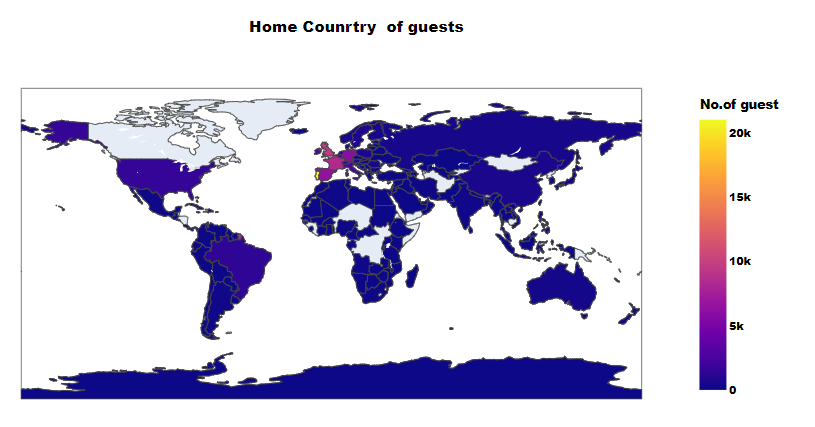

In [25]:
# from  above figure we can conclude that  queest are coming from europe specially portugal.

# How much guest pay per night per room


In [27]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [23]:
df2=df[df.is_canceled==0]

In [24]:
df2.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [25]:
fig=px.box(df2,x='reserved_room_type',y='adr',color='hotel')
fig.update_layout(
    title={
        'text': "Price of the room type per night per person",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Room_type",
    yaxis_title="Price(euro)",
    legend_title="Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()


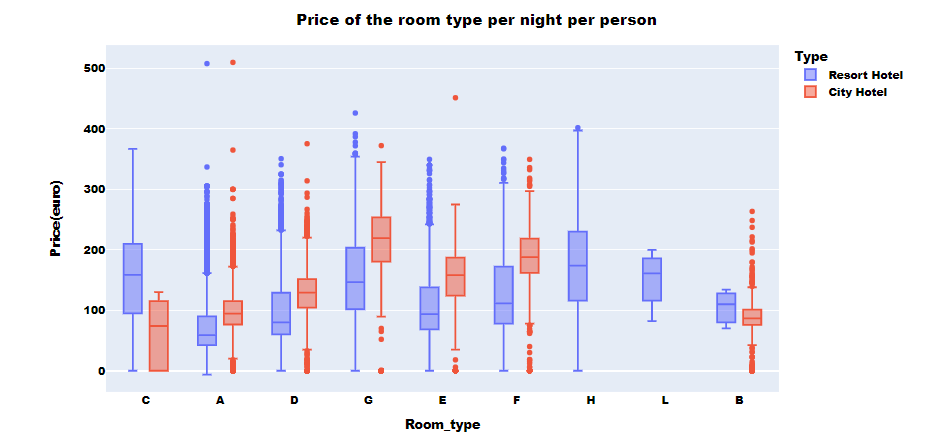

In [ ]:
For both types of hotel, guests pay more money on room type A,D,G,E,F 

# how does the price vary over a year

In [26]:
data_city=df[(df.is_canceled==0) & (df.hotel=='City Hotel')]

In [27]:
data_resort=df[(df.is_canceled==0) & (df.hotel=='Resort Hotel')]

In [28]:
data_resort=data_resort.groupby('arrival_date_month')['adr'].mean().reset_index()
data_resort

,arrival_date_month,adr
0,April,75.867816
1,August,181.205892
2,December,68.322236
3,February,54.147478
4,January,48.708919
5,July,150.122528
6,June,107.921869
7,March,57.012487
8,May,76.657558
9,November,48.681640


In [29]:
data_city.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [30]:
data_city=data_city.groupby('arrival_date_month')['adr'].mean().reset_index()


In [31]:
final=data_city.merge(data_resort,on='arrival_date_month')
final.columns=['month','mean_price_resort','mean_price_city']


In [32]:
import  sort_dataframeby_monthorweek as sd
final_df=sd.Sort_Dataframeby_Month(final,'month')
final_df

,month,mean_price_resort,mean_price_city
0,January,82.160634,48.708919
1,February,86.183025,54.147478
2,March,90.170722,57.012487
3,April,111.856824,75.867816
4,May,120.445842,76.657558
5,June,117.702075,107.921869
6,July,115.563810,150.122528
7,August,118.412083,181.205892
8,September,112.598452,96.416860
9,October,101.745956,61.727505


In [33]:
fig=px.line(final_df,x='month',y=['mean_price_resort','mean_price_city'])
#fig.update_traces(textposition='top center',texttemplate='%{text:.s}')
fig.update_layout(
    title={
        'text': "room price per night over the year",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="month",
    yaxis_title="Price(euro)",
    legend_title="Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()

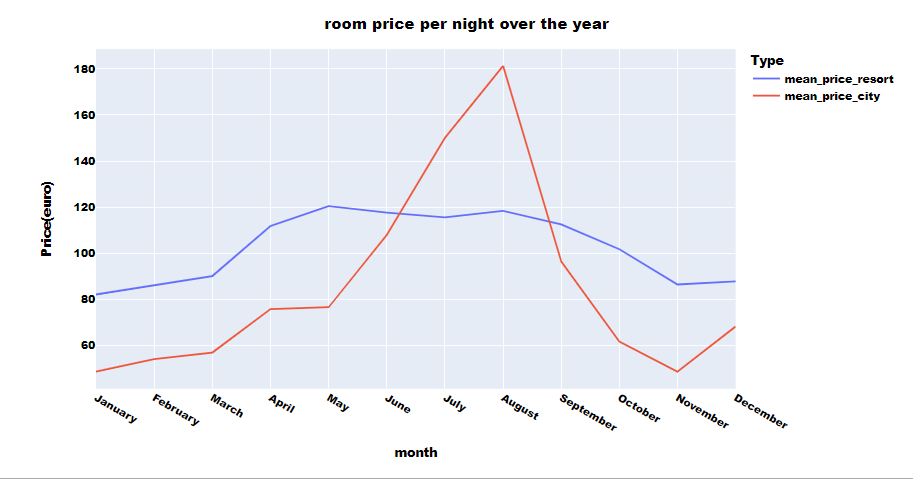

In [ ]:
For both hotel types,guests pay more in summer

# distribution of the nights spent at hotels  by market segment  and hotel types


In [34]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [35]:
fig=px.box(df,x='market_segment',y='stays_in_weekend_nights',color='hotel')
fig.update_layout(
    title={
        'text': "guests staying on the weekend nights on the basis of market segment",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="market_segment",
    yaxis_title="stays in weekend nights",
    legend_title=" Hotel Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
#people like to  stay more in resort than compare to city hotel

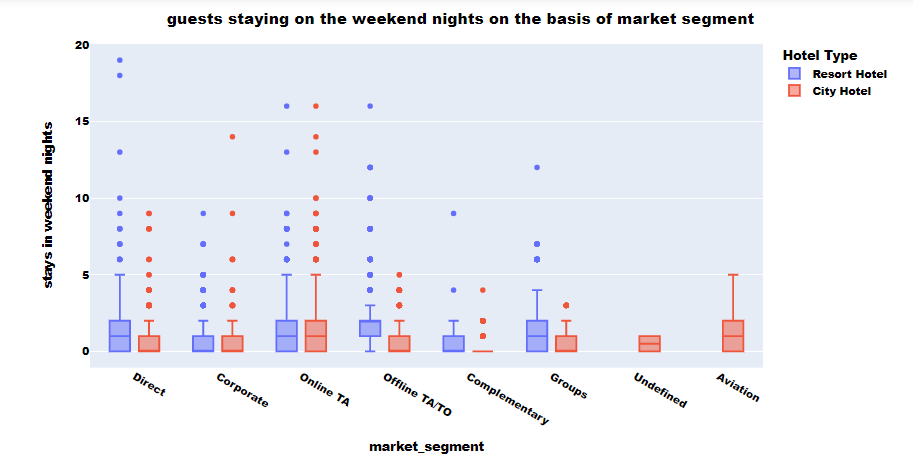

In [ ]:
most people like to stay in resort than compare to city hotel

# Analysing perferance of the guests  what they basically prefer


In [36]:
df.meal.value_counts()

BB           92310
HB           14463
SC           10650
Undefined     1169
FB             798
Name: meal, dtype: int64

In [40]:
fig=px.pie(df,values=df.meal.value_counts(),names=df.meal.value_counts().index,hole=0.5)
fig.update_layout(
    title={
        'text': "meal preferance",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Request made",
    yaxis_title="count",
    legend_title=" Meal Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()


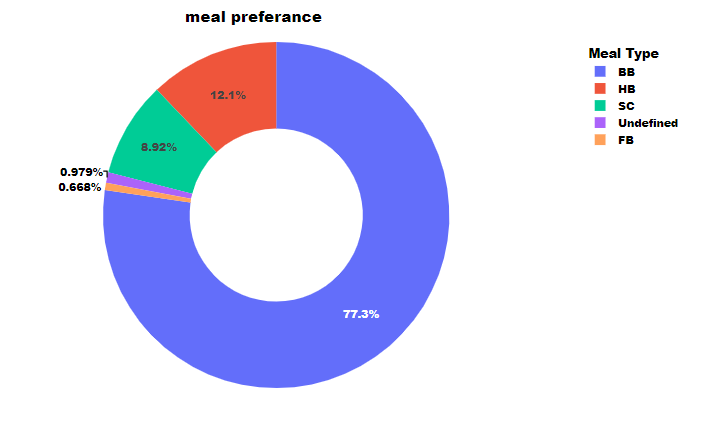

In [ ]:
alomost all booking are done with breakfast

# special request done by customers


In [43]:
#sns.countplot(df['total_of_special_requests']);

In [41]:
df_count=df['total_of_special_requests'].value_counts()
fig=px.bar(df,x=df_count.index,y=df_count,text=df_count,color=df_count.index)
fig.update_layout(
    title={
        'text': "Request made during booking",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Request made",
    yaxis_title="count",
    legend_title=" Hotel Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()


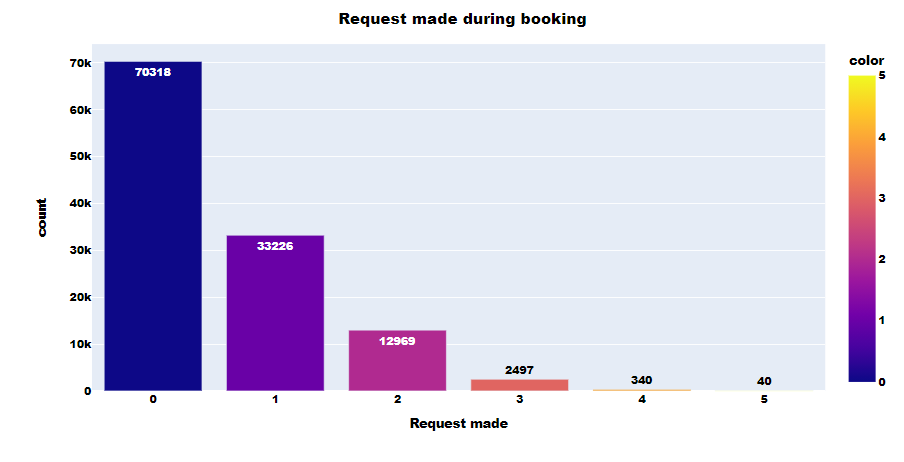

In [ ]:
most of the booking are done without any requests

# pivot table between special request and cancellation

In [44]:
df_special=df.groupby(['total_of_special_requests','is_canceled']).agg(count=('total_of_special_requests','count')).unstack()
df_special


count       
is_canceled                    0      1
total_of_special_requests              
0                          36762  33556
1                          25908   7318
2                          10103   2866
3                           2051    446
4                            304     36
5                             38      2

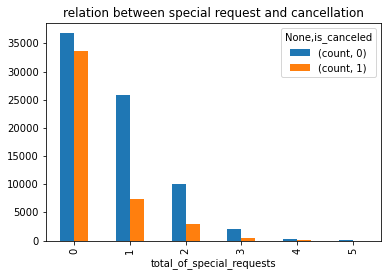

In [45]:
df_special.plot(kind='bar',title='relation between special request and cancellation');

In [ ]:
most of the cancellation were done by the guests without any special request

# analysing most busy month

In [46]:
#analysing most busy month
df['arrival_date_month'].value_counts()

August       13877
July         12661
May          11791
October      11160
April        11089
June         10939
September    10508
March         9794
February      8068
November      6794
December      6780
January       5929
Name: arrival_date_month, dtype: int64

In [47]:
df.head(1)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015


In [48]:
df3=df[df.hotel=='Resort Hotel']['arrival_date_month'].value_counts().reset_index()
df3.columns=['month','no of guests']
df3

,month,no of guests
0,August,4894
1,July,4573
2,April,3609
3,May,3559
4,October,3555
5,March,3336
6,September,3108
7,February,3103
8,June,3045
9,December,2648


In [49]:
df4=df[df.hotel=='City Hotel']['arrival_date_month'].value_counts().reset_index()
df4.columns=['month','no of guests']
df4

,month,no of guests
0,August,8983
1,May,8232
2,July,8088
3,June,7894
4,October,7605
5,April,7480
6,September,7400
7,March,6458
8,February,4965
9,November,4357


In [50]:
data_resort=df[(df.is_canceled==0) & (df.hotel=='Resort Hotel')]
data_resort=data_resort['arrival_date_month'].value_counts().reset_index()
data_resort.columns=['month','no of guests']
data_resort

,month,no of guests
0,August,3257
1,July,3137
2,October,2577
3,March,2573
4,April,2550
5,May,2535
6,February,2308
7,September,2102
8,June,2038
9,December,2017


In [51]:
data_city=df[(df.is_canceled==0) & (df.hotel=='City Hotel')]
data_city=data_city['arrival_date_month'].value_counts().reset_index()
data_city.columns=['month','no of guests']
data_city

,month,no of guests
0,August,5381
1,July,4782
2,May,4579
3,June,4366
4,October,4337
5,September,4290
6,March,4072
7,April,4015
8,February,3064
9,November,2696


In [52]:
final_rush=data_city.merge(data_resort,on='month')
final_rush.columns=['month','no of guest in city hotel','no of guest in resort hotel']
final_rush

,month,no of guest in city hotel,no of guest in resort hotel
0,August,5381,3257
1,July,4782,3137
2,May,4579,2535
3,June,4366,2038
4,October,4337,2577
5,September,4290,2102
6,March,4072,2573
7,April,4015,2550
8,February,3064,2308
9,November,2696,1976


In [53]:
final_rush=sd.Sort_Dataframeby_Month(final_rush,monthcolumnname='month')
final_rush

,month,no of guest in city hotel,no of guest in resort hotel
0,January,2254,1868
1,February,3064,2308
2,March,4072,2573
3,April,4015,2550
4,May,4579,2535
5,June,4366,2038
6,July,4782,3137
7,August,5381,3257
8,September,4290,2102
9,October,4337,2577


In [54]:
fig=px.line(final_rush,x='month',y=['no of guest in city hotel','no of guest in resort hotel'],text='value')
fig.update_traces(textposition='top center',texttemplate='%{text:.s}')

fig.update_layout(
    title={
        'text': "Guests rush with respect to month",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="month",
    yaxis_title="NO. of guests",
    legend_title=" Hotel Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()

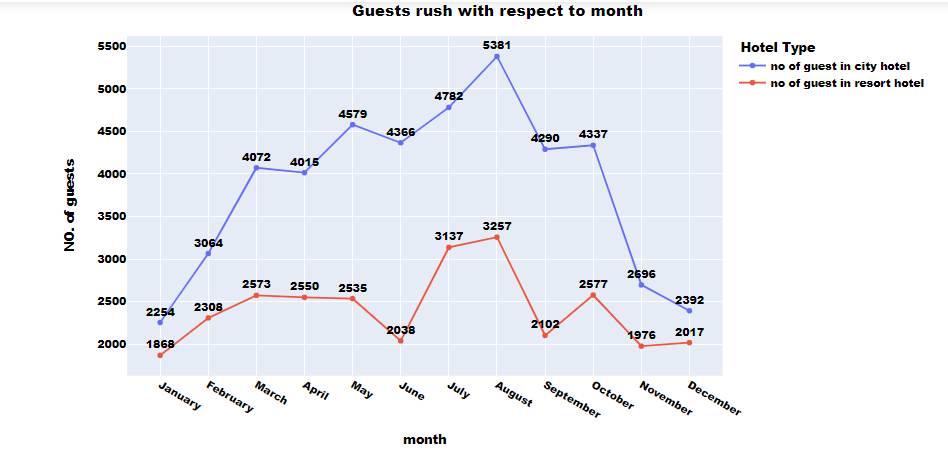

In [ ]:
For both types ot hotel,summer were best

# how long guests stay in hotel ?

In [55]:
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.00,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.00,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.00,0,1,Check-Out,7/3/2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,0.0,0,Transient,96.14,0,0,Check-Out,9/6/2017
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,0.0,0,Transient,225.43,0,2,Check-Out,9/7/2017
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,0.0,0,Transient,157.71,0,4,Check-Out,9/7/2017
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,0.0,0,Transient,104.40,0,0,Check-Out,9/7/2017


In [56]:
map1=df[df.is_canceled==0]

In [57]:
map1['total_nights']=map1['stays_in_weekend_nights']+map1['stays_in_week_nights']

In [58]:
map1.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,304.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,240.0,0.0,0,Transient,98.0,0,1,Check-Out,7/3/2015,2


In [59]:
df_stay=map1.groupby(['total_nights','hotel']).agg('count').reset_index()
df_stay=df_stay.iloc[:,0:3]
df_stay=df_stay.rename(columns={'is_canceled':'total_number'})
df_stay

,total_nights,hotel,total_number
0,0,City Hotel,308
1,0,Resort Hotel,372
2,1,City Hotel,9169
3,1,Resort Hotel,6580
4,2,City Hotel,10992
...,...,...,...
63,49,City Hotel,1
64,56,Resort Hotel,1
65,57,City Hotel,1
66,60,Resort Hotel,1


In [64]:
fig=px.bar(df_stay,x='total_nights',y='total_number',color='hotel')
fig.update_layout(
    title={
        'text': "how long guests are staying",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

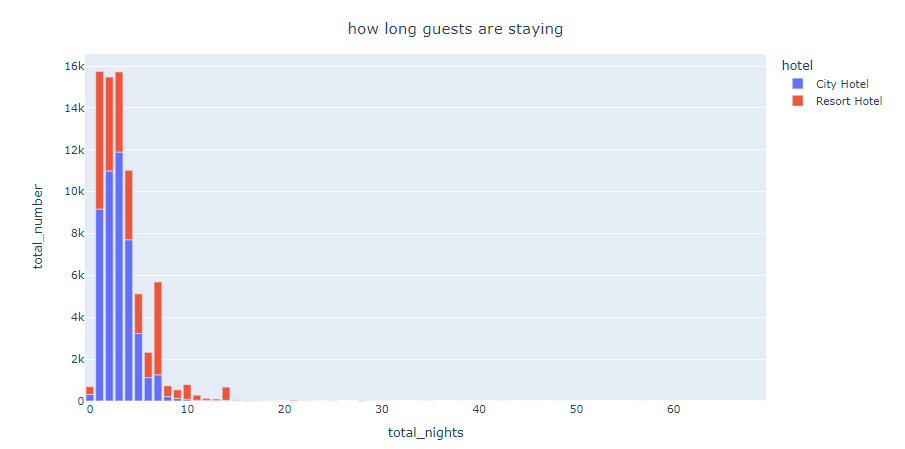

In [ ]:
most guests spend total nights in range 1-7 nights

In [65]:
#px.bar(df_stay,x='total_nights',y='total_number',facet_col='hotel')

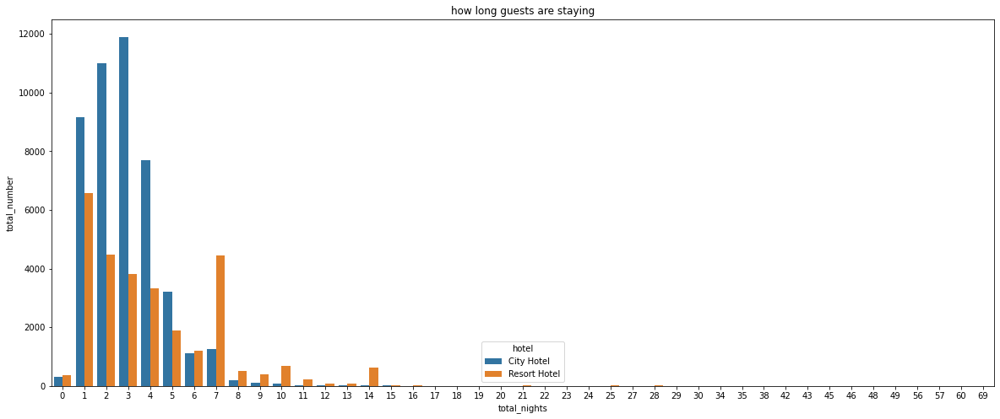

In [67]:
plt.figure(figsize=(20,8))
sns.barplot(data=df_stay,x='total_nights',y='total_number',hue='hotel')
plt.title('how long guests are staying');

# booking by market segment?

In [68]:
map1.market_segment.value_counts()

Online TA        35738
Offline TA/TO    15908
Direct           10672
Groups            7714
Corporate         4303
Complementary      646
Aviation           185
Name: market_segment, dtype: int64

In [65]:
px.pie(values=map1.market_segment.value_counts(),names=map1.market_segment.value_counts().index,hole=.5,
       title='booking by market segment')

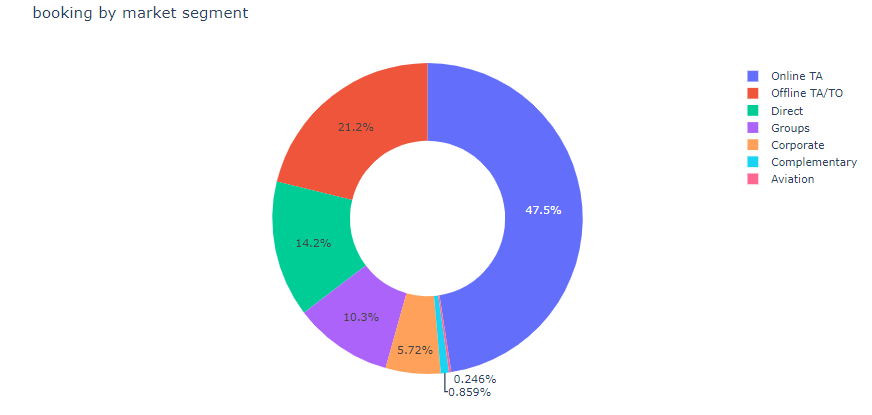

In [ ]:
most of the booking were done by online

# price per night and person based on booking and room ?

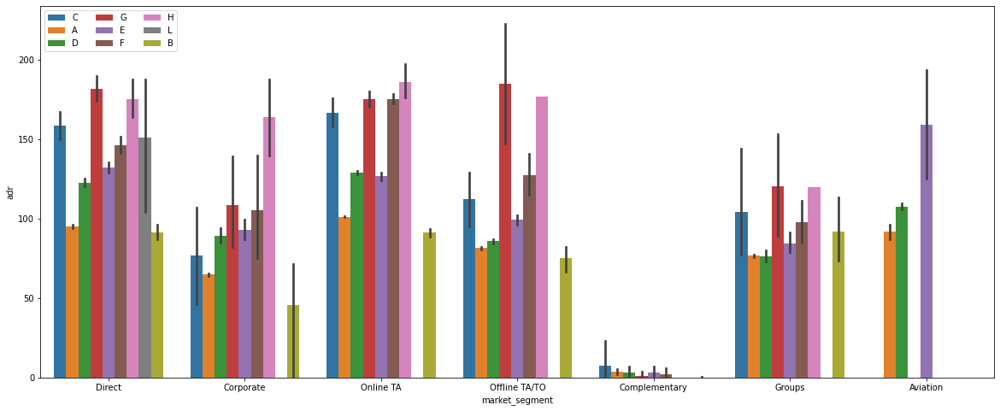

In [66]:
plt.figure(figsize=(20,8))
sns.barplot(x='market_segment',y='adr',hue='reserved_room_type',data=map1)
plt.legend( ncol=3, loc='upper left');

In [ ]:
price for direct,corporate,online Ta,offline TA/TO were more or less constant.room types H,G,C 
are most common types of room booked by customers 

# how many booking were cancelled ?

In [72]:
cancel=df[df.is_canceled==1]
cancel.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
8,Resort Hotel,1,85,2015,July,27,1,0,3,2,...,No Deposit,240.0,0.0,0,Transient,82.0,0,1,Canceled,5/6/2015
9,Resort Hotel,1,75,2015,July,27,1,0,3,2,...,No Deposit,15.0,0.0,0,Transient,105.5,0,0,Canceled,4/22/2015
10,Resort Hotel,1,23,2015,July,27,1,0,4,2,...,No Deposit,240.0,0.0,0,Transient,123.0,0,0,Canceled,6/23/2015
27,Resort Hotel,1,60,2015,July,27,1,2,5,2,...,No Deposit,240.0,0.0,0,Transient,107.0,0,2,Canceled,5/11/2015
32,Resort Hotel,1,96,2015,July,27,1,2,8,2,...,No Deposit,0.0,0.0,0,Transient,108.3,0,2,Canceled,5/29/2015


In [73]:
cancel.shape

(44224, 32)

In [74]:
cancel.groupby('hotel')['is_canceled'].agg('count')

hotel
City Hotel      33102
Resort Hotel    11122
Name: is_canceled, dtype: int64

In [75]:
px.pie(cancel,names=cancel.groupby('hotel')['is_canceled'].agg('count').index,
       values=cancel.groupby('hotel')['is_canceled'].agg('count'),
       title='cancellation of booking on hotel and resort ',hole=0.5)

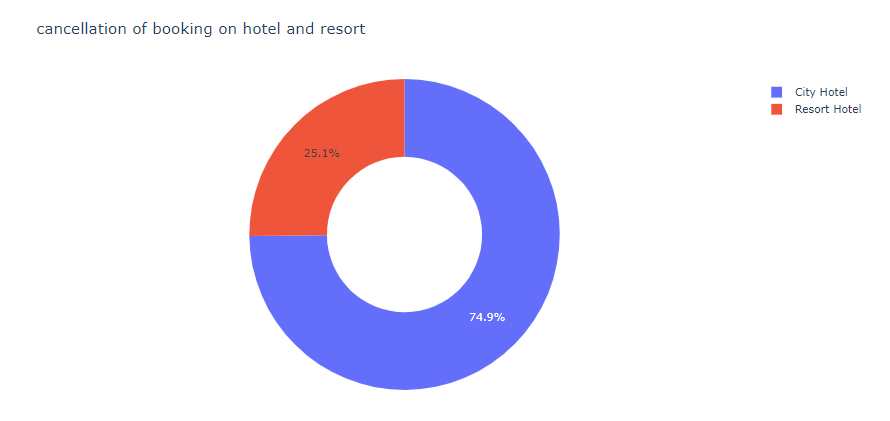

In [ ]:
most of the cancellation were done in city hotel

# which month have highest number of cancellation?

In [76]:
df.customer_type.value_counts()

Transient          89613
Transient-Party    25124
Contract            4076
Group                577
Name: customer_type, dtype: int64

In [77]:
df_can=cancel.groupby('arrival_date_month')['is_canceled'].agg('count').reset_index()
df_can.columns=['Month','Canceled']
df_cancel=sd.Sort_Dataframeby_Month(df_can,'Month')
df_cancel

,Month,Canceled
0,January,1807
1,February,2696
2,March,3149
3,April,4524
4,May,4677
5,June,4535
6,July,4742
7,August,5239
8,September,4116
9,October,4246


In [78]:
fig=px.bar(df_cancel,x='Month',y='Canceled',text='Canceled')
fig.update_traces(textposition='outside',texttemplate='%{text:.s}')

fig.update_layout(
    title={
        'text': "Cancellation with respect to month",
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Month",
    yaxis_title="NO. of Cancellation",
    legend_title=" Hotel Type",
    font=dict(
        family="Arial Black",
        size=12,
        color="Black"
    )
)
fig.show()

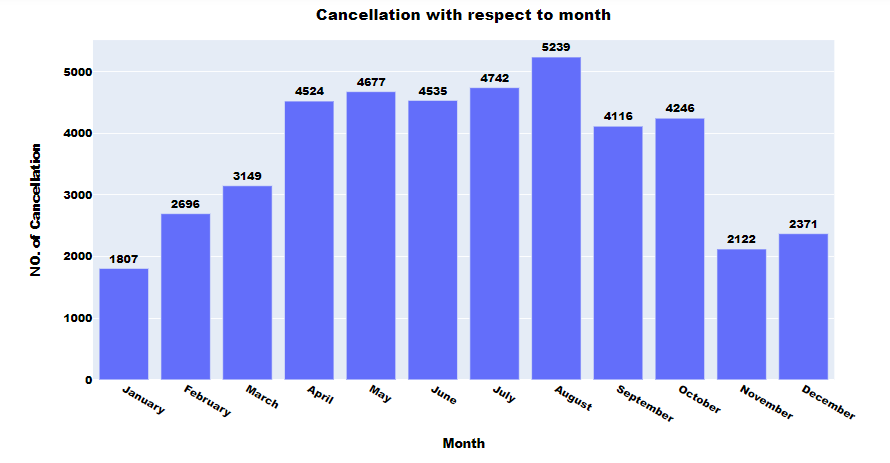

In [74]:
Maximum cancellation is in august(summer times) and least cancellation is in January.

# cancellation on the basis of the customer types ?

In [79]:
df_can=cancel.groupby(['customer_type','arrival_date_month'])['is_canceled'].agg('count')
df_can

customer_type    arrival_date_month
Contract         April                   21
                 August                 245
                 December                55
                 February                15
                 January                 11
                 July                   247
                 June                    49
                 March                   19
                 May                     18
                 November                64
                 October                278
                 September              240
Group            April                    2
                 August                   9
                 December                 5
                 February                 2
                 July                     1
                 June                     1
                 May                      3
                 November                 7
                 October                 14
                 September              

In [80]:
df_can.unstack(level=0)

customer_type,Contract,Group,Transient,Transient-Party
arrival_date_month,,,,
April,21.0,2.0,4070.0,431.0
August,245.0,9.0,3991.0,994.0
December,55.0,5.0,2063.0,248.0
February,15.0,2.0,2195.0,484.0
January,11.0,NaN,1633.0,163.0
July,247.0,1.0,3787.0,707.0
June,49.0,1.0,4140.0,345.0
March,19.0,NaN,2844.0,286.0
May,18.0,3.0,4111.0,545.0


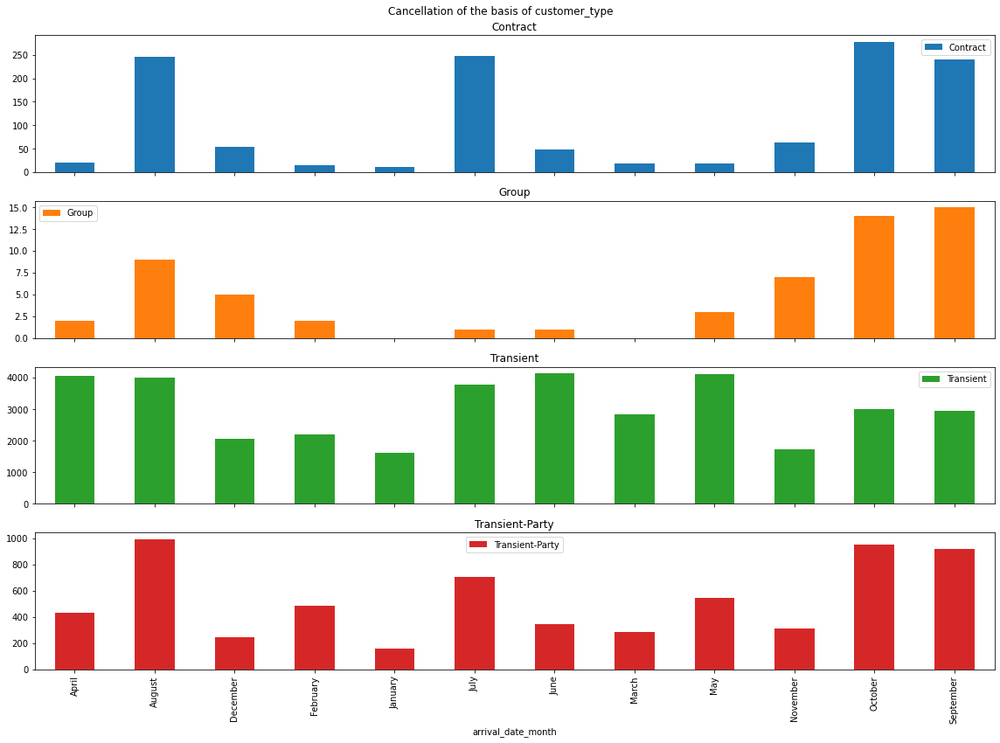

In [81]:


df_can.unstack(level=0).plot(kind='bar', subplots=True,figsize=(16,12),title=('Cancellation of the basis of customer_type'))

plt.tight_layout()

so, most of the cancellation is done by Transient customer type as shown in green bar diagram